In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, BatchNormalization, UpSampling2D, MaxPooling2D, concatenate
from tensorflow.keras import backend as K
from tensorflow.keras.losses import binary_crossentropy
import albumentations as A
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers
import cv2
from PIL import Image
import tifffile as tiff
from tqdm.auto import tqdm
from glob import glob
import gc
import os
import warnings 
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
gc.enable()
warnings.simplefilter('ignore')

In [2]:
def UNet_Model():
    inp = tf.keras.layers.Input(shape=(256, 256, 3))
    x = Conv2D(64, kernel_size=(3,3), strides=1, padding='same', activation='relu')(inp)
    x = Conv2D(64, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x1 = x
    
    x = MaxPooling2D(strides=2, padding='valid')(x)
    x = Conv2D(128, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = Conv2D(128, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x2 = x
    
    x = MaxPooling2D(strides=2, padding='valid')(x)
    x = Conv2D(256, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = Conv2D(256, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x3 = x
    
    x = MaxPooling2D(strides=2, padding='valid')(x)
    x = Conv2D(512, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = Conv2D(512, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x4 = x
    
    x = MaxPooling2D(strides=2, padding='valid')(x)
    x = Conv2D(1024, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = Conv2D(1024, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
        
    x = UpSampling2D(size=(2,2))(x)
    x = Conv2D(512, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = concatenate([x4, x], axis=3)
    
    x = Conv2D(512, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = Conv2D(512, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    
    x = UpSampling2D(size=(2,2))(x)
    x = Conv2D(256, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = concatenate([x3, x], axis=3)
    
    x = Conv2D(256, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = Conv2D(256, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    
    x = UpSampling2D(size=(2,2))(x)
    x = Conv2D(128, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = concatenate([x2, x], axis=3)
    
    x = Conv2D(128, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = Conv2D(128, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    
    x = UpSampling2D(size=(2,2))(x)
    x = Conv2D(64, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = concatenate([x1, x], axis=3)
    
    x = Conv2D(64, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    x = Conv2D(64, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)
    
    x = Conv2D(1, kernel_size=(3,3), strides=1, padding='same', activation='relu')(x)

    model = tf.keras.Model(inputs=inp, outputs=x)
    return model

model = UNet_Model()
model.summary()
tf.keras.utils.plot_model(
    model,
    to_file="Unet_model.jpg",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=600,
    layer_range=None
)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 128, 128, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [3]:
cfg = {
    'train_df': '../input/hubmap-organ-segmentation/train.csv',
    'train_img': '../input/hubmap-organ-segmentation/train_images/',
    'train_annot': '../input/hubmap-organ-segmentation/train_annotations/',
    'batch size': 16,
    'epochs': 5,
    'img_shape': 256,
    'lr': 1e-03
}

In [4]:
def mask2rle(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels= img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def rle2mask(mask_rle, shape=(1600,256)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

In [5]:
class DataSetGen(tf.keras.utils.Sequence):
    def __init__(
        self, df,
        img_dir=cfg['train_img'],
        img_shape=cfg['img_shape'],
        batch_size=cfg['batch size'],
        augments= True,
        shuffle=True
    ):
        self.df = df
        self.img_dir = img_dir
        self.img_shape = img_shape
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.augments = augments
        
        self.transform = A.Compose([
            A.augmentations.crops.RandomResizedCrop(height=self.img_shape, width=self.img_shape),
            A.augmentations.Rotate(limit=90, p=0.5),
            A.augmentations.HorizontalFlip(p=0.5),
            A.augmentations.VerticalFlip(p=0.5),
            A.augmentations.transforms.ColorJitter(p=0.5),
            A.OneOf([
                A.OpticalDistortion(p=0.5),
                A.GridDistortion(p=.5),
                A.PiecewiseAffine(p=0.5),
            ], p=0.5),
            A.OneOf([
                A.HueSaturationValue(10, 15, 10),
                A.CLAHE(clip_limit=4),
                A.RandomBrightnessContrast(),            
            ], p=0.5)
        ])    
        
    def on_epoch_end(self):
        '''
        Called after the end of every epoch, here it shuffles the dataframe
        '''
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)
        return self.df
    
    
    def __len__(self):
        '''
        Denotes the number of batches per epoch
        '''
        return len(self.df) // self.batch_size
    
    
    def __getitem__(self, idx):
        '''
        Generates one batch of data
        '''
        batch = self.df[idx * cfg['batch size'] : (idx+1) * cfg['batch size']]
        X = []; Y = []
        for _, row in batch.iterrows():
            img_id = str(row['id']) + '.tiff'
            img_path = os.path.join(self.img_dir, img_id)
            rle = row['rle']
            del row; del img_id; gc.collect()
            img, mask = self.__get_data(img_path, rle)
            if self.augments:
                aug = self.transform(image=img, mask=mask)
                img = aug['image'] / 255.0; mask = aug['mask']
            else:
                img = img / 255.0
            X.append(img); Y.append(mask)
        return np.array(X), np.array(Y).astype(np.float32)
    

    def __get_data(self, img_path, rle):
        '''
        Reads image and masks, generates tiles
        '''
        img = np.array(Image.open(img_path))
        mask = rle2mask(rle, (img.shape[0], img.shape[1]))
        img = cv2.resize(img, (self.img_shape, self.img_shape)).astype('uint8')
        mask = cv2.resize(mask, (self.img_shape, self.img_shape)).reshape((self.img_shape, self.img_shape, 1)).astype('int')
        return img, mask

In [6]:
df = pd.read_csv(cfg['train_df'])
del df['age'], df['img_height'], df['img_width'], df['pixel_size'], df['tissue_thickness'], df['sex'], df['data_source'], df['organ']
df.head()

train_df, valid_df = train_test_split(df, test_size=0.2, shuffle=False, random_state=0)
train_ds = DataSetGen(train_df)
valid_ds = DataSetGen(valid_df, augments=False)

In [7]:
!pip install -U segmentation-models
import segmentation_models as sm
sm.set_framework('tf.keras')
sm.framework()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.3 MB/s eta 0:00:00a 0:00:01
Segmentation Models: using `keras` framework.


'tf.keras'

In [8]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=cfg['lr']),#SGD(learning_rate=cfg['lr'], momentum=0.9, nesterov=True)
    loss= sm.losses.bce_jaccard_loss, #tf.keras.losses.BinaryCrossentropy(from_logits=False),
    metrics= [sm.metrics.f1_score]
)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath='/kaggle/working/best_model.h5',
    monitor='val_loss',
    verbose=0,
    save_best_only=True,
    mode='min'
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.9,
    patience=2,
    verbose=0,
    mode='min'
)

es = tf.keras.callbacks.EarlyStopping(
    patience=6,
    min_delta=0,
    monitor='val_loss',
    restore_best_weights=True,
    verbose=0,
    mode='min',
    baseline=None
)

history = model.fit(train_ds, 
                    validation_data=valid_ds,
                    use_multiprocessing=True,
                    workers=4,
                    epochs = cfg['epochs'],
                    #callbacks=[es,reduce_lr,checkpoint],
                    verbose=1
                   )
model.save('/kaggle/working/Unet_model.h5')

Epoch 1/5
17/17 [==============================] - 153s 7s/step - loss: 1.4682 - f1-score: 0.1505 - val_loss: 1.2769 - val_f1-score: 0.1088
Epoch 2/5
17/17 [==============================] - 119s 6s/step - loss: 1.3604 - f1-score: 0.1450 - val_loss: 1.3332 - val_f1-score: 0.1354
Epoch 3/5
17/17 [==============================] - 113s 6s/step - loss: 1.3536 - f1-score: 0.1668 - val_loss: 1.2667 - val_f1-score: 0.1195
Epoch 4/5
17/17 [==============================] - 135s 6s/step - loss: 1.3292 - f1-score: 0.1486 - val_loss: 1.2696 - val_f1-score: 0.1329
Epoch 5/5
17/17 [==============================] - 136s 6s/step - loss: 1.3285 - f1-score: 0.1648 - val_loss: 1.2513 - val_f1-score: 0.1228


In [9]:
train_data = {'epochs': [i for i in range(1, (len(history.history['loss']))+ 1)], 'train_loss': history.history['loss'], 'val_loss': history.history['val_loss'], 'train_f1-score':history.history['f1-score'], 'val_f1-score':history.history['val_f1-score']}
train_data = pd.DataFrame(train_data)
train_data.to_csv('train_data.csv', index=False)
display(train_data)

,epochs,train_loss,val_loss,train_f1-score,val_f1-score
0,1,1.468217,1.276870,0.150533,0.108782
1,2,1.360390,1.333169,0.145029,0.135442
2,3,1.353563,1.266705,0.166768,0.119542
3,4,1.329199,1.269623,0.148630,0.132877
4,5,1.328529,1.251280,0.164849,0.122758


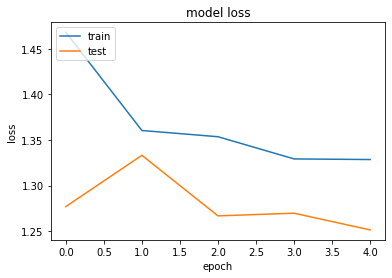

In [11]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig('model_loss.jpg', dpi=600)
plt.show()

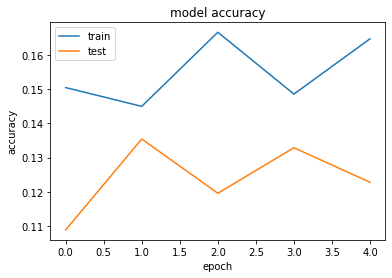

In [12]:
plt.plot(history.history['f1-score'])
plt.plot(history.history['val_f1-score'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.savefig('model_f1-score.jpg', dpi=600)
plt.show()